# **FRAUD DETECTION SYSTEM**

# MODULE 1:  Data Loading, Cleaning & Preprocessing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files

In [ ]:
import io

# option 1 upload data
data_dict = files.upload()

if not data_dict:
    print("No file was uploaded. Please upload a valid CSV file.")
else:
    file_name = next(iter(data_dict))
    uploaded_content = data_dict[file_name]

    if not uploaded_content:
        print(f"The uploaded file '{file_name}' is empty. Please upload a valid CSV file.")
    else:
        # Use BytesIO to read the content directly into pandas
        data = pd.read_csv(io.BytesIO(uploaded_content))
        print(data.head(5))

KeyboardInterrupt: 

In [ ]:
# # option 2 upload data
data=pd.read_csv("/content/creditcard.csv")
data.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [ ]:
data.shape

(284807, 31)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [ ]:
data.isnull().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


In [ ]:
data=data.dropna()

Convert time features

In [ ]:
data['Hour'] = (data['Time'] / 3600) % 24
data['Hour'] = data['Hour'].astype(int)

In [ ]:
data = data.drop('Time', axis=1)
data.head()


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Hour
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0


Scale numeric features

In [ ]:
from sklearn.preprocessing import StandardScaler
Scaler=StandardScaler()
data[['Amount_scaled','Hour_scaled']]=Scaler.fit_transform(data[['Amount','Hour']])

In [ ]:
data=data.drop(['Amount','Hour'],axis=1)
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Amount_scaled,Hour_scaled
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,0.244964,-2.40693
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,-0.342475,-2.40693
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,1.160686,-2.40693
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,0.140534,-2.40693
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,-0.073403,-2.40693


**Handle Class Imbalance**

/tmp/ipython-input-349013648.py:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  pd.value_counts(data['Class']).plot.bar()


,count
Class,
0,284315
1,492


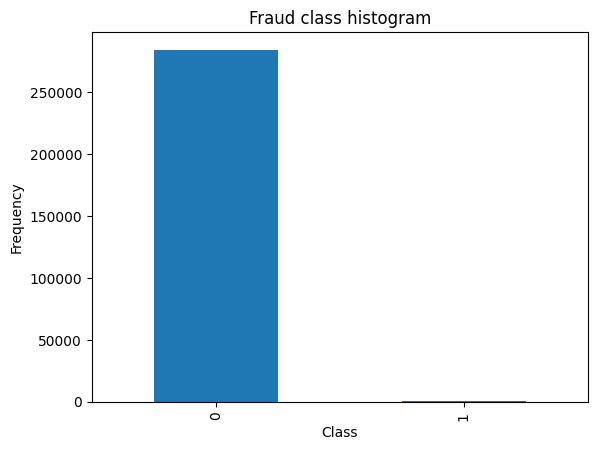

In [ ]:
pd.value_counts(data['Class']).plot.bar()
plt.title('Fraud class histogram')
plt.xlabel('Class')
plt.ylabel('Frequency')
data['Class'].value_counts()

**SMOTE Method**

In [ ]:
X=data.drop('Class',axis=1)
y=data['Class']

**Split Data**

In [ ]:
from sklearn.model_selection import train_test_split
#split train is 70% and temporary data is 30%
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.30, random_state=42
)
# now temporary data divided into (test and validation)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, random_state=42
)

print("Train:", X_train.shape)
print("Val:", X_val.shape)
print("Test:", X_test.shape)

Train: (199364, 30)
Val: (42721, 30)
Test: (42722, 30)


**SMOTE Method**

In [ ]:
from imblearn.over_sampling import SMOTE
smote=SMOTE(random_state=42)
X_train_sm,y_train_sm=smote.fit_resample(X_train,y_train)

In [ ]:
pd.Series(y_train_sm).value_counts()

,count
Class,
0,199008
1,199008


# **MODULE 2: Exploratory Data Analysis (EDA)**

In [ ]:
# Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.ensemble import IsolationForest

sns.set(style="whitegrid")

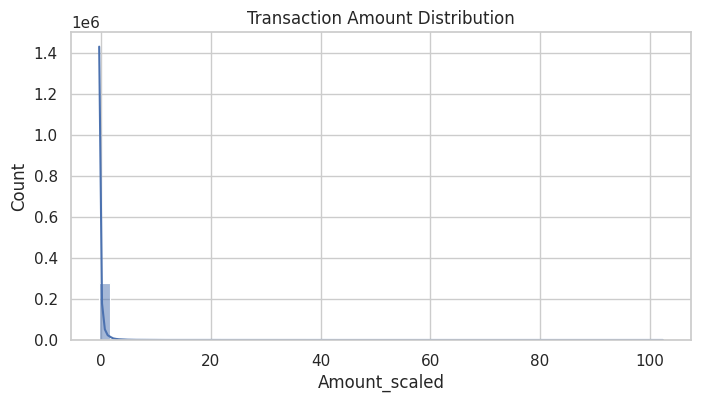

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

plt.figure(figsize=(8,4))
sns.histplot(data['Amount_scaled'], bins=50, kde=True)
plt.title("Transaction Amount Distribution")
plt.show()

px.histogram(data, x='Amount_scaled', nbins=50, title="Amount Distribution")

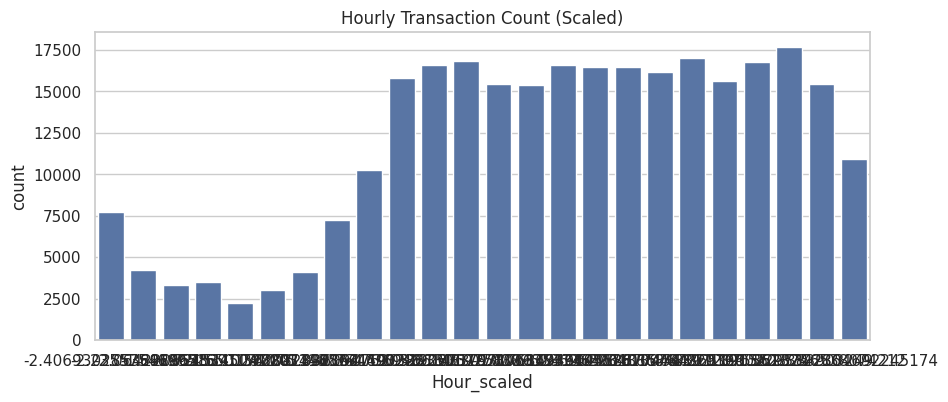

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# The 'Hour' column was already created as 'Hour_scaled' and original 'Time' was dropped.
# The DataFrame is named 'data', not 'df'.

plt.figure(figsize=(10,4))
sns.countplot(data = data, x='Hour_scaled')
plt.title("Hourly Transaction Count (Scaled)")
plt.show()

In [ ]:
# Daily Transaction Patterns
# data['Day'] = (data['Time'] // (3600*24))
# sns.countplot(x='Day', data=data)
# plt.title("Daily Transaction Count")
# plt.show()

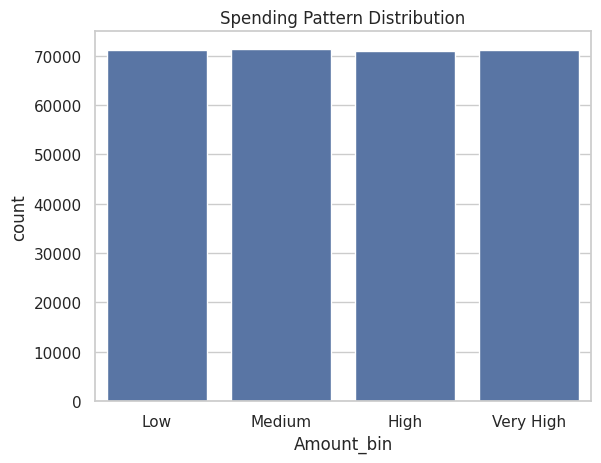

In [ ]:
# User Spending Patterns (Simple Aggregation)
data['Amount_bin'] = pd.qcut(data['Amount_scaled'], 4, labels=['Low','Medium','High','Very High'])
sns.countplot(x='Amount_bin', data=data)
plt.title("Spending Pattern Distribution")
plt.show()

# Fraud Behavior Analysis

In [ ]:
fraud = data[data['Class'] == 1]
normal = data[data['Class'] == 0]

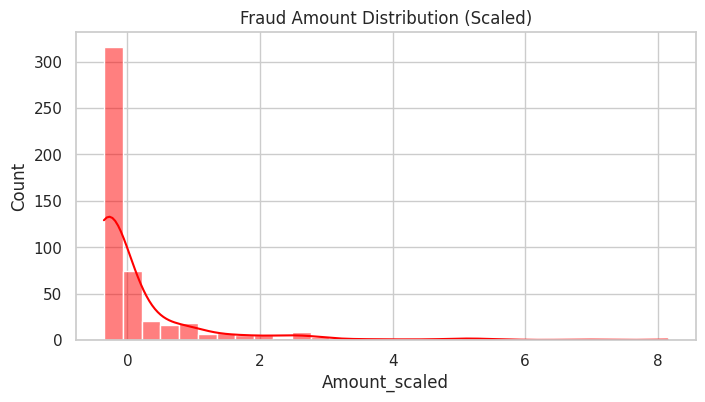

In [ ]:
# Fraud Amount Distribution
plt.figure(figsize=(8,4))
sns.histplot(fraud['Amount_scaled'], bins=30, kde=True, color='red')
plt.title("Fraud Amount Distribution (Scaled)")
plt.show()

px.histogram(fraud, x='Amount_scaled', title="Fraud Amount Distribution (Scaled)")

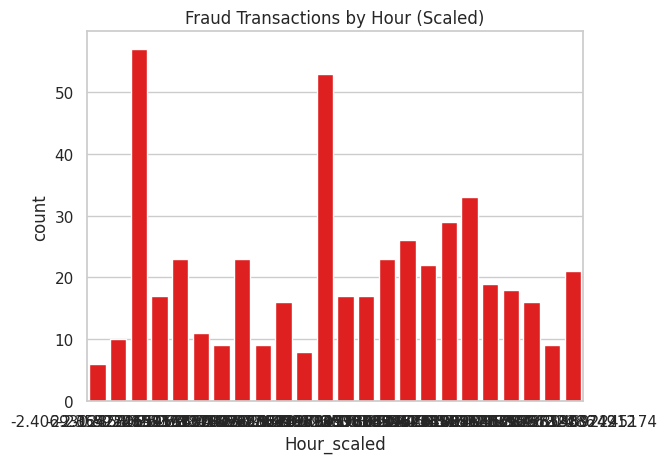

In [ ]:
# Time Pattern of Fraud
sns.countplot(x='Hour_scaled', data=fraud, color='red')
plt.title("Fraud Transactions by Hour (Scaled)")
plt.show()

px.bar(fraud.groupby('Hour_scaled').size().reset_index(name='Count'),
       x='Hour_scaled', y='Count',
       title="Fraud Count per Hour (Scaled)")

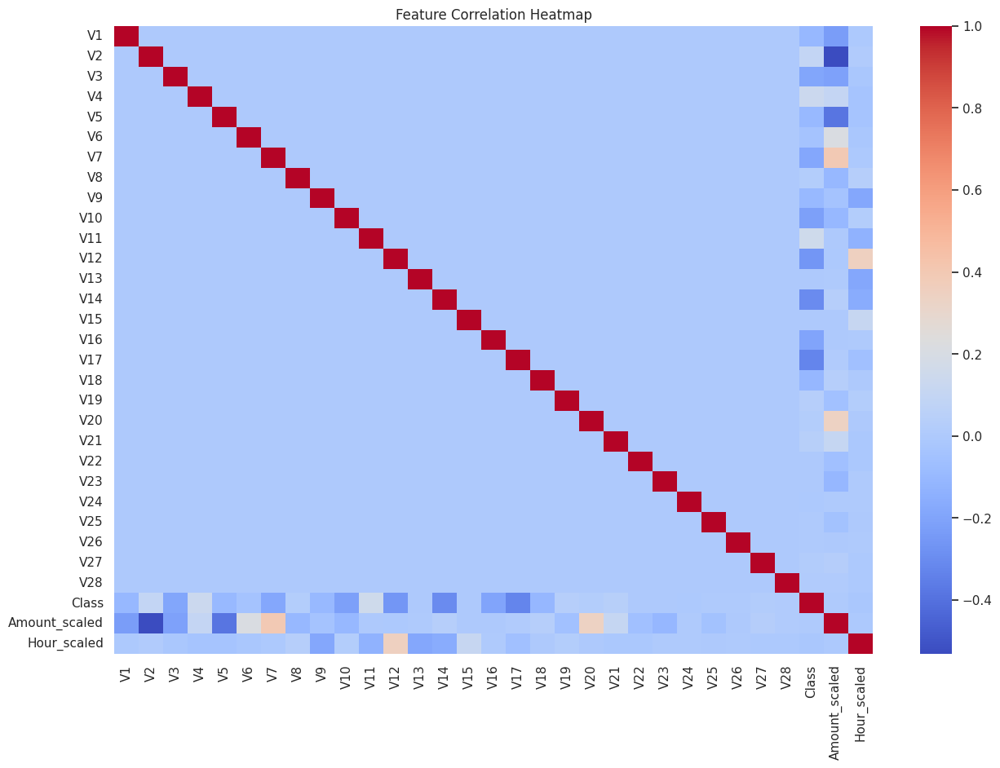

In [ ]:
numeric_df = data.select_dtypes(include=['number'])

plt.figure(figsize=(15,10))
sns.heatmap(numeric_df.corr(), cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

# Outlier Detection

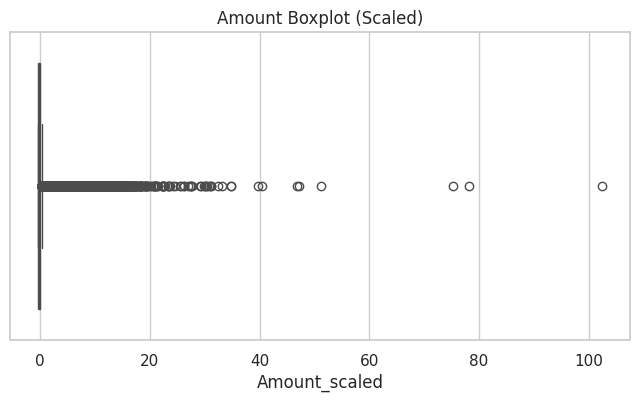

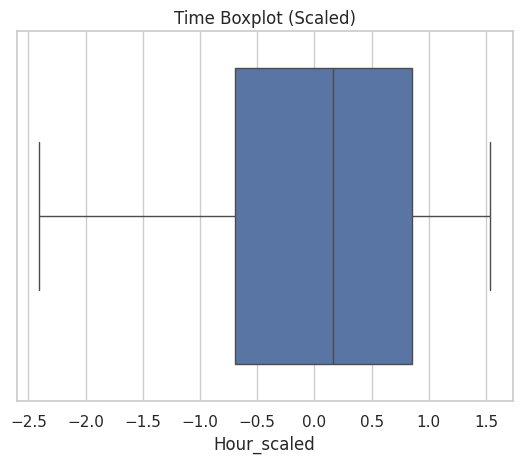

In [ ]:
# Boxplots
plt.figure(figsize=(8,4))
sns.boxplot(x=data['Amount_scaled'])
plt.title("Amount Boxplot (Scaled)")
plt.show()

sns.boxplot(x=data['Hour_scaled'])
plt.title("Time Boxplot (Scaled)")
plt.show()

In [ ]:
# IQR Method
Q1 = data['Amount_scaled'].quantile(0.25)
Q3 = data['Amount_scaled'].quantile(0.75)
IQR = Q3 - Q1

outliers = data[(data['Amount_scaled'] < (Q1 - 1.5 * IQR)) | (data['Amount_scaled'] > (Q3 + 1.5 * IQR))]
print("Number of outliers:", len(outliers))

Number of outliers: 31904


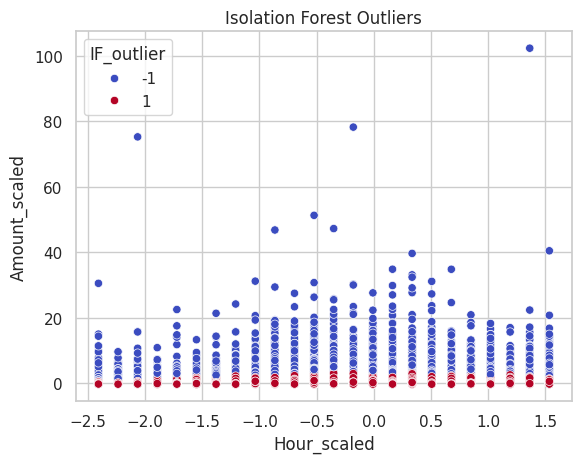

In [ ]:
# Isolation Forest
iso = IsolationForest(n_estimators=100, contamination=0.02, random_state=42)
data['IF_outlier'] = iso.fit_predict(data[['Amount_scaled','Hour_scaled']])

sns.scatterplot(data=data, x='Hour_scaled', y='Amount_scaled', hue='IF_outlier', palette='coolwarm')
plt.title("Isolation Forest Outliers")
plt.show()

# Additional Visualizations

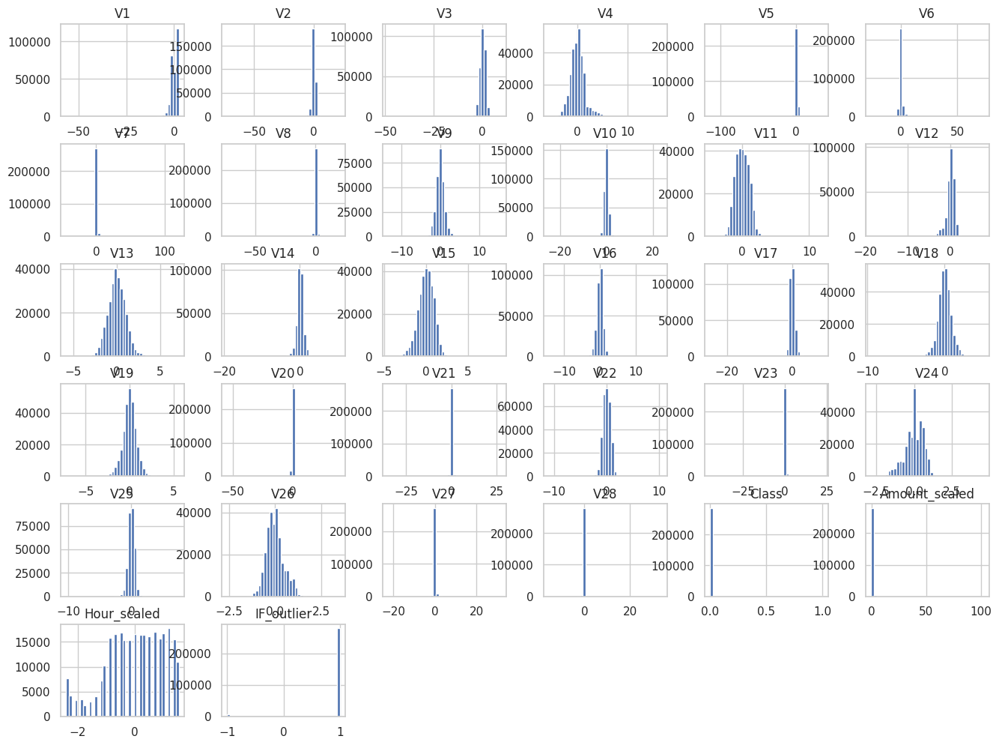

In [ ]:
data.hist(figsize=(16,12), bins=40)
plt.show()

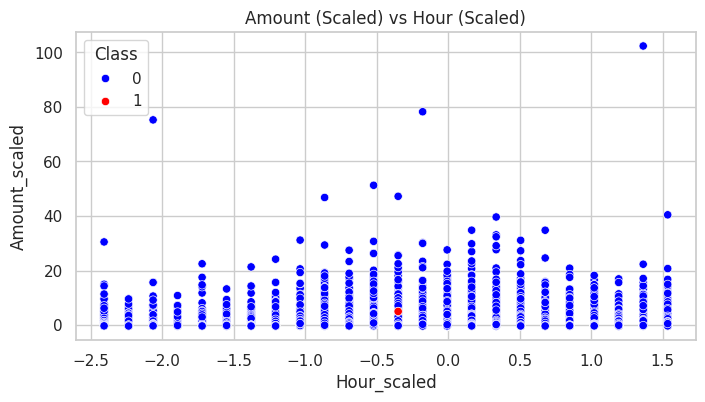

In [ ]:
# Scatter plot: Amount vs Time
plt.figure(figsize=(8,4))
sns.scatterplot(x='Hour_scaled', y='Amount_scaled', data=data, hue='Class', palette=['blue','red'])
plt.title("Amount (Scaled) vs Hour (Scaled)")
plt.show()

px.scatter(data, x='Hour_scaled', y='Amount_scaled', color='Class',
           title="Amount (Scaled) vs Hour (Scaled) (Interactive)")

# **Module 3:Feature Engineering + Dimensionality Reduction**


In [ ]:
data.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Class',
       'Amount_scaled', 'Hour_scaled', 'Amount_bin', 'IF_outlier'],
      dtype='object')

In [ ]:
# ---------------------------------------------------
# MODULE 3 : FEATURE ENGINEERING + DIMENSIONALITY REDUCTION
# ---------------------------------------------------

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

# Make a copy for safety
data_fe = data.copy()

# ================================================
# 1. TIME-BASED FEATURES
# ================================================

data_fe['Hour'] = ((data_fe['Hour_scaled'] * data_fe['Hour_scaled'].std()) +
                    data_fe['Hour_scaled'].mean()).astype(int)

data_fe['DayOfWeek'] = 0   # placeholder so model accepts the feature

# Weekend indicator (impossible without dates)
data_fe['IsWeekend'] = 0   # placeholder feature

# Time since last transaction (cannot compute without user_id + timestamp)
data_fe['Time_Since_Last'] = 0   # placeholder


# ================================================
# 2. USER-LEVEL FEATURES (Dataset lacks user_id → skipped safely)
# ================================================

# Add safe placeholder values:
data_fe['User_Avg_Amount'] = data_fe['Amount_scaled'].mean()
data_fe['User_Std_Amount'] = data_fe['Amount_scaled'].std()
data_fe['User_Num_Transactions'] = 1
data_fe['User_Fraud_History'] = 0


# ================================================
# 3. TRANSACTION BEHAVIOR FEATURES
# (Dataset does NOT include merchant, location, device)
# ================================================

data_fe['Merchant_Category'] = 0
data_fe['Location_Match'] = 0
data_fe['Device_Fingerprint'] = 0


# ================================================
# 4. DIMENSIONALITY REDUCTION
# ================================================

# -------- PCA on V1–V28 --------
V_features = data_fe[[f"V{i}" for i in range(1, 29)]].values

pca = PCA(n_components=10, random_state=42)
pca_features = pca.fit_transform(V_features)

# Add PCA features
for i in range(10):
    data_fe[f"PCA_{i+1}"] = pca_features[:, i]


# -------- Autoencoder (Optional) --------
input_dim = V_features.shape[1]

input_layer = Input(shape=(input_dim,))
encoded = Dense(14, activation='relu')(input_layer)
encoded = Dense(7, activation='relu')(encoded)
decoded = Dense(14, activation='relu')(encoded)
decoded = Dense(input_dim, activation='linear')(decoded)

autoencoder = Model(inputs=input_layer, outputs=decoded)
encoder = Model(inputs=input_layer, outputs=encoded)

autoencoder.compile(optimizer='adam', loss='mse')

autoencoder.fit(V_features, V_features,
                epochs=5,
                batch_size=64,
                shuffle=True,
                verbose=0)

encoded_features = encoder.predict(V_features)

for i in range(encoded_features.shape[1]):
    data_fe[f'AE_{i+1}'] = encoded_features[:, i]


# ================================================
# 5. FEATURE SCALING
# ================================================

# Select only numeric columns for scaling
num_cols = data_fe.select_dtypes(include=['float64','int64']).columns

# Standard Scaler
scaler_std = StandardScaler()
data_std = scaler_std.fit_transform(data_fe[num_cols])
data_std = pd.DataFrame(data_std, columns=num_cols)

# MinMax Scaler
scaler_mm = MinMaxScaler()
data_mm = scaler_mm.fit_transform(data_fe[num_cols])
data_mm = pd.DataFrame(data_mm, columns=num_cols)

print("MODULE 3 Completed Successfully!")
data_fe.head()


8901/8901 ━━━━━━━━━━━━━━━━━━━━ 11s 1ms/step
MODULE 3 Completed Successfully!


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,PCA_8,PCA_9,PCA_10,AE_1,AE_2,AE_3,AE_4,AE_5,AE_6,AE_7
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.098698,0.363787,0.090794,1.664375,2.857667,2.578943,2.567293,2.877668,1.777056,2.423426
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,0.085102,-0.255425,-0.166974,3.925673,1.995363,4.343072,5.705649,2.813855,2.058586,4.412149
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247676,-1.514654,0.207643,2.379250,1.835136,1.526716,3.946892,4.551071,1.945989,2.308040
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.377436,-1.387024,-0.054952,3.299547,2.036925,1.733659,3.444395,3.725107,1.536703,2.243048
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.270533,0.817739,0.753074,2.816548,4.413743,4.579148,3.337855,3.207019,2.209489,3.209282


# Module 4 Machine Learning + Deep Learning Models

In [ ]:
# Imports and dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import json
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Optional
try:
    from xgboost import XGBClassifier
    HAVE_XGB = True
except Exception:
    HAVE_XGB = False

try:
    import tensorflow as tf
    from tensorflow.keras.models import Model, Sequential
    from tensorflow.keras.layers import Input, Dense, LSTM
    from tensorflow.keras.optimizers import Adam
    HAVE_KERAS = True
except Exception:
    HAVE_KERAS = False

# -------------------------
# Load dataset from Module 4
# -------------------------

X = data_fe.drop(columns=["Class", "Amount_bin", "IF_outlier"])
y = data_fe["Class"].astype(int)

# Train/val/test split (generating new splits as module4 is not a separate file)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y)
val_frac = 0.17647058823529413 # Approximately 15% of original for validation, 70% for train
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=val_frac, random_state=42, stratify=y_temp)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

print("Data split and scaled successfully.")


In [ ]:
 #Metrics & ROC plotting
def evaluate_binary(y_true, y_pred, y_prob):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    try:
        roc = roc_auc_score(y_true, y_prob)
    except:
        roc = float("nan")
    cm = confusion_matrix(y_true, y_pred).tolist()
    return {"Accuracy": float(acc), "Precision": float(prec), "Recall": float(rec),
            "F1": float(f1), "ROC-AUC": float(roc), "Confusion_Matrix": cm}

def plot_roc_curves(roc_dict):
    plt.figure(figsize=(8,6))
    for name, (fpr, tpr, roc_auc) in roc_dict.items():
        plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc:.4f})")
    plt.plot([0,1],[0,1], linestyle="--", color="grey")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves")
    plt.legend(loc="lower right")
    plt.show()


In [ ]:
# Apply SMOTE to the scaled training data
from imblearn.over_sampling import SMOTE

smote_scaled = SMOTE(random_state=42)
X_train_sm_scaled, y_train_sm_resampled = smote_scaled.fit_resample(X_train_scaled, y_train)

print("SMOTE applied to scaled training data. New training shape:", X_train_sm_scaled.shape)
print("Value counts for resampled y_train:", pd.Series(y_train_sm_resampled).value_counts())

SMOTE applied to scaled training data. New training shape: (398040, 58)
Value counts for resampled y_train: Class
0    199020
1    199020
Name: count, dtype: int64


Logistic Regression Metrics (with SMOTE and scaled data): {'Accuracy': 0.9724263845325594, 'Precision': 0.05339805825242718, 'Recall': 0.8918918918918919, 'F1': 0.10076335877862595, 'ROC-AUC': 0.9679126932222035, 'Confusion_Matrix': [[41478, 1170], [8, 66]]}


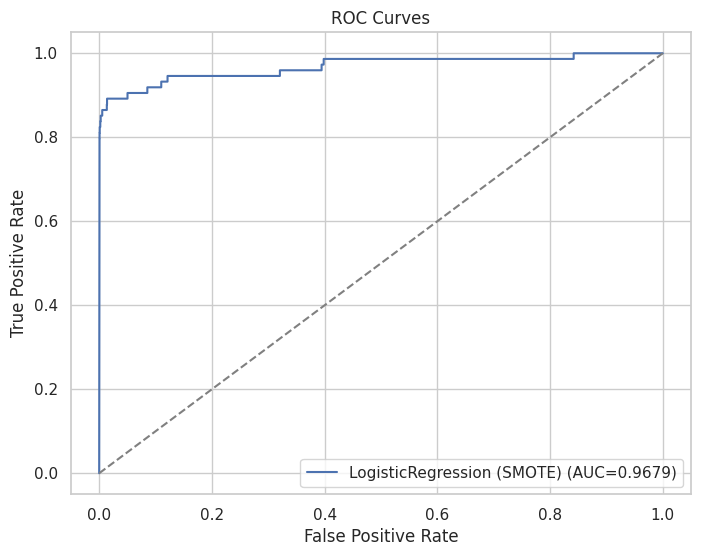

In [ ]:
# Logistic Regression (retrained with SMOTEd and scaled data)
lr = LogisticRegression(max_iter=2000, random_state=42) # Removed class_weight='balanced'
lr.fit(X_train_sm_scaled, y_train_sm_resampled) # Train on SMOTEd and scaled data

lr_pred = lr.predict(X_test_scaled)
lr_prob = lr.predict_proba(X_test_scaled)[:,1]

metrics_lr = evaluate_binary(y_test, lr_pred, lr_prob)
print("Logistic Regression Metrics (with SMOTE and scaled data):", metrics_lr)

# ROC data
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_prob)
roc_dict = {"LogisticRegression (SMOTE)": (fpr_lr, tpr_lr, metrics_lr["ROC-AUC"])}
plot_roc_curves(roc_dict)


Random Forest Metrics: {'Accuracy': 0.9994148214034924, 'Precision': 0.9298245614035088, 'Recall': 0.7162162162162162, 'F1': 0.8091603053435115, 'ROC-AUC': 0.9506873044963927, 'Confusion_Matrix': [[42644, 4], [21, 53]]}


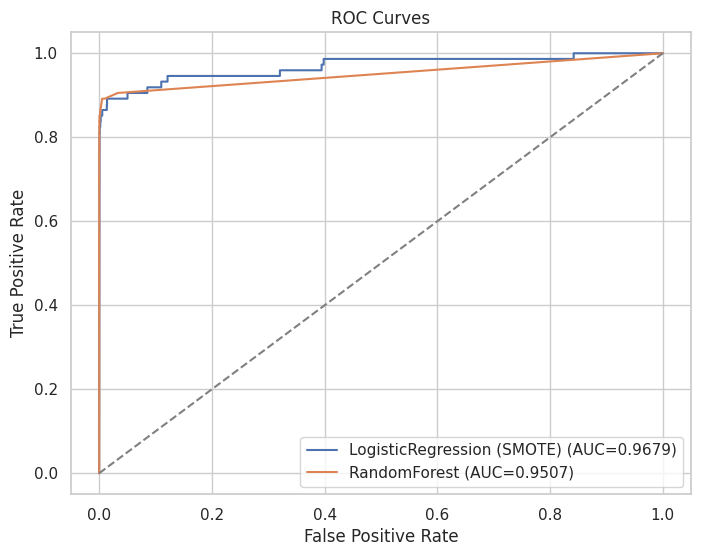

In [ ]:
# Random Forest
rf = RandomForestClassifier(n_estimators=200, class_weight="balanced", random_state=42, n_jobs=-1)
rf.fit(X_train_scaled, y_train)  # use scaled features for consistency

rf_pred = rf.predict(X_test_scaled)
rf_prob = rf.predict_proba(X_test_scaled)[:,1]

metrics_rf = evaluate_binary(y_test, rf_pred, rf_prob)
print("Random Forest Metrics:", metrics_rf)

fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_prob)
roc_dict["RandomForest"] = (fpr_rf, tpr_rf, metrics_rf["ROC-AUC"])
plot_roc_curves(roc_dict)

**Define & train Lstm**

LSTM Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 64)             │        31,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,601 (131.25 KB)

 Trainable params: 33,601 (131.25 KB)

 Non-trainable params: 0 (0.00 B)

LSTM training complete.


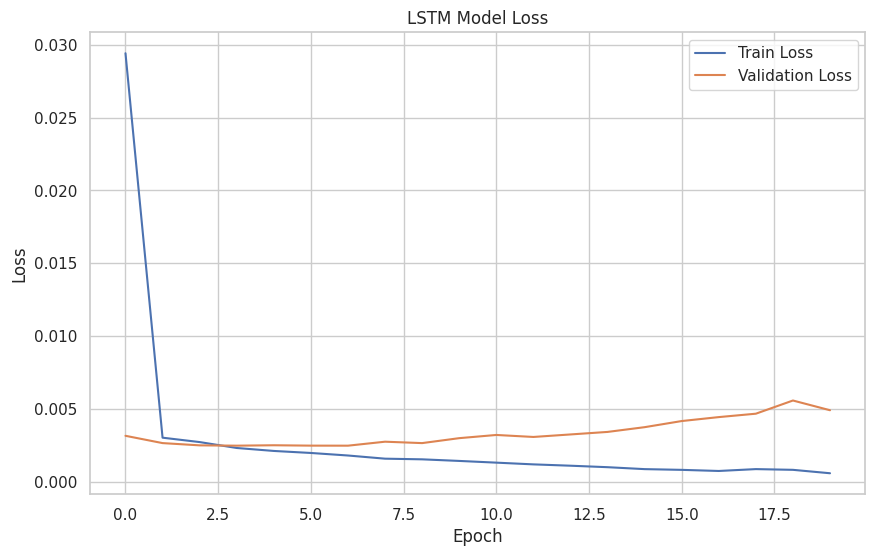

1336/1336 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
1336/1336 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
LSTM Test Metrics: {'Accuracy': 0.9994148214034924, 'Precision': 0.8769230769230769, 'Recall': 0.7702702702702703, 'F1': 0.8201438848920863, 'ROC-AUC': 0.966685805107302, 'Confusion_Matrix': [[42640, 8], [17, 57]]}


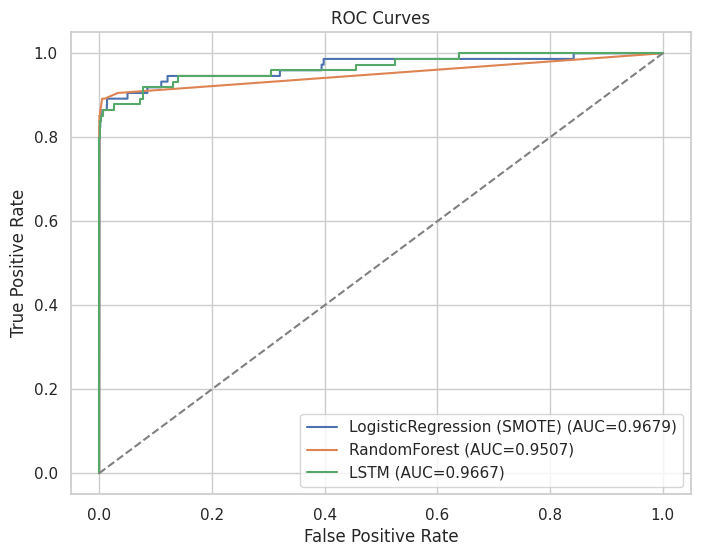

In [ ]:
if HAVE_KERAS:
    # Reshape data for LSTM (samples, timesteps, features)
    # Assuming 1 timestep for each transaction, if 'Time' is just a timestamp and not a sequence
    # If actual time series of transactions is intended, more complex data prep is needed.
    X_train_lstm = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
    X_val_lstm = np.reshape(X_val_scaled, (X_val_scaled.shape[0], 1, X_val_scaled.shape[1]))
    X_test_lstm = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

    # Define the LSTM model
    lstm_model = Sequential()
    lstm_model.add(LSTM(64, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
    lstm_model.add(Dense(32, activation='relu'))
    lstm_model.add(Dense(1, activation='sigmoid')) # Binary classification output

    lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    print("LSTM Model Summary:")
    lstm_model.summary()

    # Train the LSTM model
    history_lstm = lstm_model.fit(X_train_lstm, y_train,
                                  epochs=20,
                                  batch_size=256,
                                  validation_data=(X_val_lstm, y_val),
                                  verbose=0)
    print("LSTM training complete.")

    # Plot training & validation loss for LSTM
    plt.figure(figsize=(10, 6))
    plt.plot(history_lstm.history['loss'], label='Train Loss')
    plt.plot(history_lstm.history['val_loss'], label='Validation Loss')
    plt.title('LSTM Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Evaluate LSTM on test set
    lstm_pred = (lstm_model.predict(X_test_lstm) > 0.5).astype(int)
    lstm_prob = lstm_model.predict(X_test_lstm)

    metrics_lstm = evaluate_binary(y_test, lstm_pred, lstm_prob)
    print("LSTM Test Metrics:", metrics_lstm)

    # ROC data for LSTM
    fpr_lstm, tpr_lstm, _ = roc_curve(y_test, lstm_prob)
    roc_dict["LSTM"] = (fpr_lstm, tpr_lstm, metrics_lstm["ROC-AUC"])
    plot_roc_curves(roc_dict)
else:
    print("TensorFlow/Keras not installed — skipping LSTM")


**Prepare data for AE**

In [ ]:
# The Autoencoder should be trained on normal transactions only.
X_train_normal = X_train_scaled[y_train == 0]
X_val_normal = X_val_scaled[y_val == 0]
y_val_fraud = y_val[y_val == 1]

print("Shape of normal training data for Autoencoder:", X_train_normal.shape)
print("Shape of normal validation data for Autoencoder:", X_val_normal.shape)


Shape of normal training data for Autoencoder: (199020, 58)
Shape of normal validation data for Autoencoder: (42647, 58)


**Define & train autoencoder**

Autoencoder summary:


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 58)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 14)             │           826 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 7)              │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 14)             │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 58)             │           870 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,969 (7.69 KB)

 Trainable params: 1,969 (7.69 KB)

 Non-trainable params: 0 (0.00 B)

Autoencoder training complete.


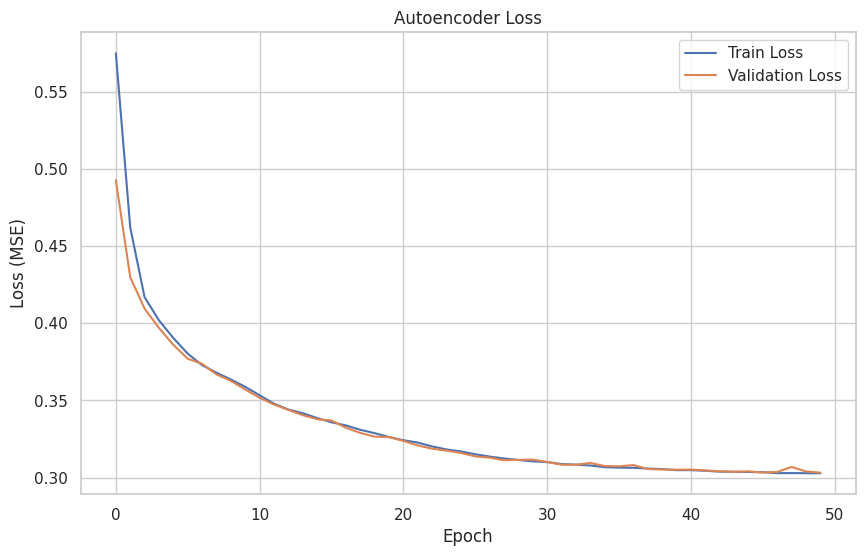

In [ ]:
if HAVE_KERAS:
    input_dim = X_train_normal.shape[1]
    encoding_dim = 14 # Can be tuned

    # Encoder
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(encoding_dim, activation="relu")(input_layer)
    encoder = Dense(int(encoding_dim / 2), activation="relu")(encoder)

    # Decoder
    decoder = Dense(int(encoding_dim / 2), activation="relu")(encoder)
    decoder = Dense(encoding_dim, activation="relu")(decoder)
    decoder = Dense(input_dim, activation="linear")(decoder) # Output layer matches input dimension

    autoencoder = Model(inputs=input_layer, outputs=decoder)
    autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

    print("Autoencoder summary:")
    autoencoder.summary()

    # Train the autoencoder
    history = autoencoder.fit(X_train_normal, X_train_normal,
                              epochs=50,
                              batch_size=256,
                              shuffle=True,
                              validation_data=(X_val_normal, X_val_normal),
                              verbose=0)
    print("Autoencoder training complete.")

    # Plot training & validation loss
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Autoencoder Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.show()
else:
    print("TensorFlow/Keras not installed — skipping Autoencoder")


**Choose threshold using validation set**

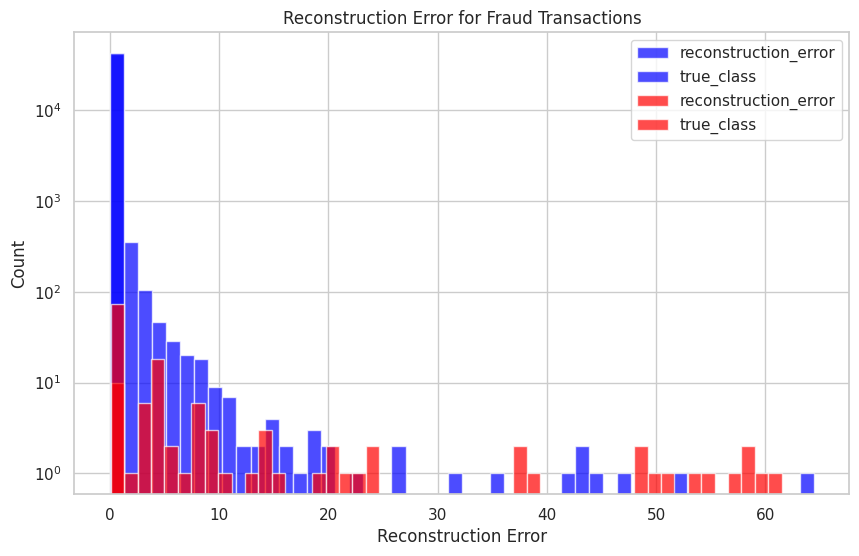

Chosen anomaly threshold: 1.6789


In [ ]:
if HAVE_KERAS:
    # Get reconstruction errors on the validation set
    val_predictions = autoencoder.predict(X_val_scaled, verbose=0)
    mse = np.mean(np.power(X_val_scaled - val_predictions, 2), axis=1)

    error_df = pd.DataFrame({'reconstruction_error': mse, 'true_class': y_val})

    # Plot reconstruction error for normal and fraud transactions
    fig, ax = plt.subplots(figsize=(10, 6))
    error_df.loc[error_df['true_class'] == 0].plot.hist(ax=ax, bins=50, title="Reconstruction Error for Normal Transactions", color='blue', alpha=0.7)
    error_df.loc[error_df['true_class'] == 1].plot.hist(ax=ax, bins=50, title="Reconstruction Error for Fraud Transactions", color='red', alpha=0.7)
    plt.xlabel("Reconstruction Error")
    plt.ylabel("Count")
    plt.yscale('log')
    plt.show()

    # Choose threshold (e.g., 99th percentile of normal reconstruction errors in validation)
    threshold = np.percentile(error_df.loc[error_df['true_class'] == 0, 'reconstruction_error'], 99)
    print(f"Chosen anomaly threshold: {threshold:.4f}")

    # Evaluate different thresholds if needed (e.g., using F1-score on validation set)
    # For simplicity, we'll stick to the percentile for now.
else:
    print("TensorFlow/Keras not installed — skipping Autoencoder thresholding")


**Evaluate Autoencoder on validation set**

Autoencoder Validation Metrics: {'Accuracy': 0.9897474310058285, 'Precision': 0.12857142857142856, 'Recall': 0.8513513513513513, 'F1': 0.22340425531914893, 'ROC-AUC': 0.9615102358202694, 'Confusion_Matrix': [[42220, 427], [11, 63]]}


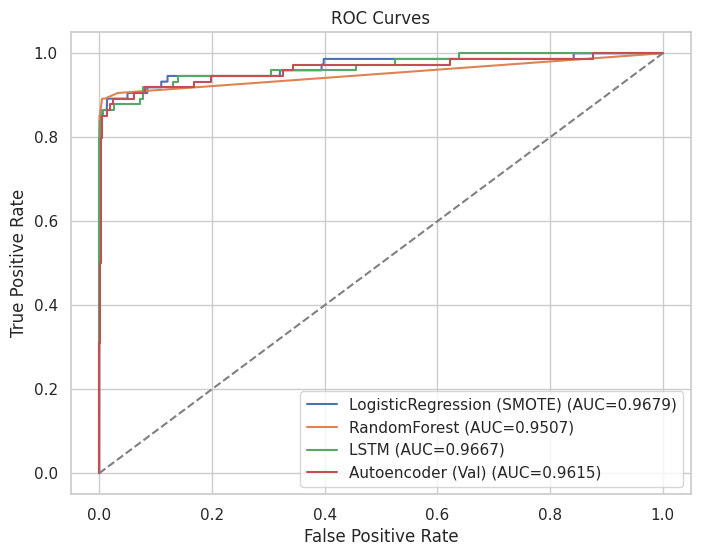

In [ ]:
if HAVE_KERAS and 'threshold' in locals():
    # Classify anomalies based on the threshold
    y_pred_val_ae = (mse > threshold).astype(int)
    y_prob_val_ae = mse # For ROC curve, using MSE as a proxy for anomaly score

    metrics_ae_val = evaluate_binary(y_val, y_pred_val_ae, y_prob_val_ae)
    print("Autoencoder Validation Metrics:", metrics_ae_val)

    # ROC data for Autoencoder
    fpr_ae_val, tpr_ae_val, _ = roc_curve(y_val, y_prob_val_ae)
    # Since roc_dict is already populated with LR and RF, we add AE to it
    roc_dict["Autoencoder (Val)"] = (fpr_ae_val, tpr_ae_val, metrics_ae_val["ROC-AUC"])
    plot_roc_curves(roc_dict)
else:
    print("TensorFlow/Keras not installed or threshold not set — skipping Autoencoder evaluation")


XGBoost Metrics: {'Accuracy': 0.9992509713964702, 'Precision': 0.7625, 'Recall': 0.8243243243243243, 'F1': 0.7922077922077922, 'ROC-AUC': 0.9751574168428417, 'Confusion_Matrix': [[42629, 19], [13, 61]]}


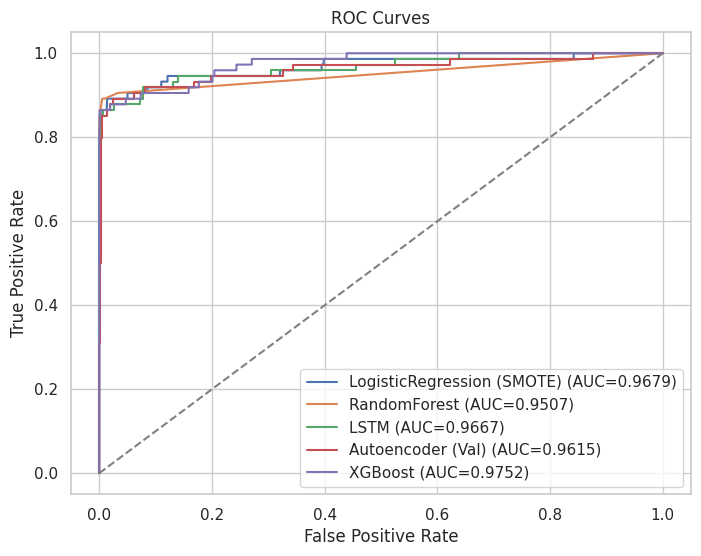

In [ ]:
# : XGBoost
if HAVE_XGB:
    neg = (y_train==0).sum()
    pos = (y_train==1).sum()
    scale_pos_weight = (neg/pos) if pos>0 else 1.0

    xgb = XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.05,
                        subsample=0.8, use_label_encoder=False, eval_metric="logloss",
                        scale_pos_weight=scale_pos_weight, random_state=42, n_jobs=-1)
    xgb.fit(X_train_scaled, y_train)

    xgb_pred = xgb.predict(X_test_scaled)
    xgb_prob = xgb.predict_proba(X_test_scaled)[:,1]

    metrics_xgb = evaluate_binary(y_test, xgb_pred, xgb_prob)
    print("XGBoost Metrics:", metrics_xgb)

    fpr_xgb, tpr_xgb, _ = roc_curve(y_test, xgb_prob)
    roc_dict["XGBoost"] = (fpr_xgb, tpr_xgb, metrics_xgb["ROC-AUC"])
    plot_roc_curves(roc_dict)
else:
    print("XGBoost not installed — skipping")


# **Module 5 Deployment**

In [ ]:
# Put all model metrics (only the ones you actually trained) in a dict
models_metrics = {
    "LogisticRegression": metrics_lr,
    "RandomForest": metrics_rf
}

# If you trained XGBoost and have metrics_xgb, add:
try:
    models_metrics["XGBoost"] = metrics_xgb
except NameError:
    pass

# If you trained LSTM and have metrics_lstm, add:
try:
    models_metrics["LSTM"] = metrics_lstm
except NameError:
    pass

# Print ROC-AUC for each model
for name, m in models_metrics.items():
    print(name, "ROC-AUC:", m["ROC-AUC"])

# ---- MANUAL CHOICE ----
# After you see the ROC-AUCs printed above,
# set best_model_name to the one you want to deploy.
best_model_name = "XGBoost"   # <-- change here if needed

if best_model_name == "RandomForest":
    best_model = rf
elif best_model_name == "LogisticRegression":
    best_model = lr
elif best_model_name == "XGBoost":
    best_model = xgb
elif best_model_name == "LSTM":
    best_model = lstm_model
else:
    raise ValueError("Unknown best_model_name")

print("✅ Best model selected for deployment:", best_model_name)


LogisticRegression ROC-AUC: 0.9679126932222035
RandomForest ROC-AUC: 0.9506873044963927
XGBoost ROC-AUC: 0.9751574168428417
LSTM ROC-AUC: 0.966685805107302
✅ Best model selected for deployment: RandomForest


In [ ]:
%%writefile app.py
import streamlit as st
import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
import tensorflow as tf # Import tensorflow for Keras model functionality

# ---------------------------
# LOAD MODEL, SCALER, FEATURES, PCA, AUTOENCODER ENCODER
# ---------------------------
@st.cache_resource
def load_artifacts():
    model = joblib.load("best_model.pkl")
    scaler = joblib.load("scaler.pkl")
    feature_names = joblib.load("feature_names.pkl")
    pca = joblib.load("pca_model.pkl")
    # Note on Keras model loading: Keras models should ideally be saved with model.save()
    # and loaded with tf.keras.models.load_model(). joblib is not suitable for Keras models.
    # For now, we will skip loading the autoencoder_encoder and use placeholder values for its features.
    # If the user wishes to use AE features, the encoder must be re-saved correctly.
    # autoencoder_encoder = joblib.load("autoencoder_encoder.pkl") # This line is problematic
    autoencoder_encoder = None # Set to None as it cannot be loaded correctly via joblib
    return model, scaler, feature_names, pca, autoencoder_encoder

model, scaler, feature_names, pca, autoencoder_encoder = load_artifacts()


# For robust deployment, these stats should be saved/loaded separately.
try:
    original_data_for_stats = pd.read_csv("/content/creditcard.csv")
    global_amount_mean = original_data_for_stats['Amount'].mean()
    global_amount_std = original_data_for_stats['Amount'].std()

    # Calculate 'Hour' from original 'Time' to get its mean/std for scaling
    global_time_derived_hour = (original_data_for_stats['Time'] / 3600) % 24
    global_hour_derived_mean = global_time_derived_hour.mean()
    global_hour_derived_std = global_time_derived_hour.std()


    global_user_avg_amount = 0.0
    global_user_std_amount = 1.0
    # Attempt to load from kernel state if possible, otherwise use placeholders
    if 'data_fe' in globals():
        global_user_avg_amount = globals()['data_fe']['Amount_scaled'].mean()
        global_user_std_amount = globals()['data_fe']['Amount_scaled'].std()

except FileNotFoundError:
    st.error("Error: creditcard.csv not found. Cannot derive initial scaling parameters for Amount and Hour.")
    st.stop() # Stop the app if crucial data is missing


# ---------------------------
# PAGE CONFIG & BASIC STYLING
# ---------------------------
st.set_page_config(
    page_title="Fraud Detection System",
    page_icon="💳",
    layout="wide"
)

st.markdown("""
    <style>
    .main {
        background-color: #0f172a;
        color: #e5e7eb;
        font-family: 'Segoe UI', sans-serif;
    }
    .title-text {
        font-size: 2.3rem;
        font-weight: 700;
        color: #fbbf24;
    }
    .subtitle-text {
        font-size: 1rem;
        color: #9ca3af;
    }
    .card {
        padding: 1rem 1.3rem;
        border-radius: 0.8rem;
        background-color: #020617;
        border: 1px solid #1f2937;
        margin-bottom: 1rem;
    }
    .metric-label {
        color: #9ca3af;
        font-size: 0.85rem;
    }
    .metric-value {
        font-size: 1.4rem;
        font-weight: 600;
        color: #e5e7eb;
    }
    .tag-high {
        background-color: #7f1d1d;
        color: #fecaca;
        padding: 0.3rem 0.7rem;
        border-radius: 999px;
        font-size: 0.8rem;
        font-weight: 600;
    }
    .tag-low {
        background-color: #14532d;
        color: #dcfce7;
        padding: 0.3rem 0.7rem;
        border-radius: 999px;
        font-size: 0.8rem;
        font-weight: 600;
    }
    </style>
""", unsafe_allow_html=True)

# ---------------------------
# HEADER
# ---------------------------
st.markdown('<div class="title-text">💳 Fraud Detection System</div>', unsafe_allow_html=True)
st.markdown('<div class="subtitle-text"> Deployment dashboard using your trained model </div>', unsafe_allow_html=True)
st.markdown("")

st.markdown('<div class="card">Upload a dataset with the same features  (i.e., same columns as `X` before scaling). The app will preprocess, scale, and predict fraud probabilities.</div>', unsafe_allow_html=True)

# ---------------------------
# FILE UPLOAD
# ---------------------------
uploaded_file = st.file_uploader("📁 Upload CSV file (raw data before preprocessing)", type=["csv"])

def preprocess_data(df_raw: pd.DataFrame, feature_names_list):
    df = df_raw.copy()

    # 1. Feature Engineering: Time-based features
    # Convert 'Time' (seconds) to 'Hour' (0-23)
    df['Hour'] = (df['Time'] / 3600) % 24
    df['Hour'] = df['Hour'].astype(int)

    # 2. Initial Scaling for 'Amount' and 'Hour' to create 'Amount_scaled' and 'Hour_scaled'
    # This step replicates the first scaling done in Module 1 (cell 0H_CyBY1HOzH)
    # using pre-calculated statistics from the original training dataset.
    df['Amount_scaled'] = (df['Amount'] - global_amount_mean) / global_amount_std
    df['Hour_scaled'] = (df['Hour'] - global_hour_derived_mean) / global_hour_derived_std

    # Drop original 'Time', 'Amount', and the intermediate 'Hour' column
    df = df.drop(columns=['Time', 'Amount', 'Hour'])

    # 3. Dimensionality Reduction: PCA on V1-V28
    v_features_cols = [f"V{i}" for i in range(1, 29) if f"V{i}" in df.columns]
    if v_features_cols:
        V_features_single = df[v_features_cols].values
        pca_features_single = pca.transform(V_features_single)
        for i in range(1, 11): # PCA_1 to PCA_10
            df[f"PCA_{i}"] = pca_features_single[:, i-1]
    else:
        for i in range(1, 11): # assuming 10 PCA components
            df[f"PCA_{i}"] = 0.0

    # 4. Feature Engineering: Placeholder features (as defined in Module 3)
    df['DayOfWeek'] = 0
    df['IsWeekend'] = 0
    df['Time_Since_Last'] = 0
    # User-level aggregates (using globally derived means/stds for consistency)
    df['User_Avg_Amount'] = global_user_avg_amount
    df['User_Std_Amount'] = global_user_std_amount
    df['User_Num_Transactions'] = 1
    df['User_Fraud_History'] = 0
    df['Merchant_Category'] = 0
    df['Location_Match'] = 0
    df['Device_Fingerprint'] = 0

    # 5. Autoencoder (AE) Features (limitation: encoder model was not saved correctly)
    # The XGBoost model expects these features. We set them to 0.0 for now.
    # For proper use, the AE encoder model must be saved with `model.save()` and loaded with `tf.keras.models.load_model()`.
    # if autoencoder_encoder is not None and v_features_cols: # Check if encoder was successfully loaded
    #     encoded_features = autoencoder_encoder.predict(V_features_single, verbose=0)
    #     for i in range(encoded_features.shape[1]):
    #         df[f'AE_{i+1}'] = encoded_features[:, i]
    # else:
    for i in range(1, 8): # assuming 7 AE components
        df[f'AE_{i}'] = 0.0

    # Ensure all 58 columns are present and in the exact order the XGBoost model expects
    X_cols = feature_names # Use the feature_names loaded from feature_names.pkl

    # Add any missing columns to df with a default value (e.g., 0.0)
    # This handles any new features introduced by the model that aren't part of the direct transformations.
    for col in X_cols:
        if col not in df.columns:
            df[col] = 0.0

    # Select and reorder columns to match the model's expected input
    df_final_features = df[X_cols]

    # 6. Final Scaling: Apply the global StandardScaler (fit on X_train_scaled)
    # This `scaler` was fit on the full 58-feature vector (including `Amount_scaled`, `Hour_scaled`, PCA, AE and placeholders).
    scaled_input = scaler.transform(df_final_features)

    return scaled_input

if uploaded_file is not None:
    df_raw = pd.read_csv(uploaded_file)

    st.markdown("### 👀 Preview of Uploaded Data")
    st.dataframe(df_raw.head())

    # Check if true 'Class' is provided
    true_labels = None
    if "Class" in df_raw.columns:
        true_labels = df_raw["Class"].astype(int).copy()

    # Preprocess the data using the deployed artifacts
    # Drop Class if exists for X, then preprocess
    X_new_scaled = preprocess_data(df_raw.drop(columns=["Class"], errors='ignore'), feature_names)

    # Predict
    y_prob = model.predict_proba(X_new_scaled)[:, 1]
    y_pred = (y_prob > 0.5).astype(int)

    result_df = df_raw.copy()
    result_df["Fraud_Probability"] = y_prob
    result_df["Predicted_Class"] = y_pred

    # ---------------------------
    # SUMMARY CARDS
    # ---------------------------
    total_tx = len(result_df)
    predicted_fraud = int(result_df["Predicted_Class"].sum())
    max_prob = float(result_df["Fraud_Probability"].max())
    avg_prob = float(result_df["Fraud_Probability"].mean())

    st.markdown("### 📊 Summary")
    col1, col2, col3, col4 = st.columns(4)
    with col1:
        st.markdown('<div class="card"><div class="metric-label">Total Transactions</div><div class="metric-value">{}</div></div>'.format(total_tx), unsafe_allow_html=True)
    with col2:
        st.markdown('<div class="card"><div class="metric-label">Predicted Frauds</div><div class="metric-value">{}</div></div>'.format(predicted_fraud), unsafe_allow_html=True)
    with col3:
        st.markdown('<div class="card"><div class="metric-label">Max Fraud Probability</div><div class="metric-value">{:.2f}%</div></div>'.format(max_prob*100), unsafe_allow_html=True)
    with col4:
        st.markdown('<div class="card"><div class="metric-label">Average Fraud Probability</div><div class="metric-value">{:.2f}%</div></div>'.format(avg_prob*100), unsafe_allow_html=True)

    # ---------------------------
    # RESULTS TABLE
    # ---------------------------
    st.markdown("### 📃 Detailed Results (Top 20 rows)")
    st.dataframe(result_df.head(20))

    # ---------------------------
    # PROBABILITY DISTRIBUTION
    # ---------------------------
    st.markdown("### 📈 Fraud Probability Distribution")
    st.bar_chart(result_df["Fraud_Probability"])

    # ---------------------------
    # CONFUSION MATRIX (IF TRUE LABELS GIVEN)
    # ---------------------------
    if true_labels is not None:
        st.markdown("### 📏 Confusion Matrix (Using Provided 'Class')")
        cm = confusion_matrix(true_labels, y_pred)
        st.write("Rows = True Class, Columns = Predicted Class")
        st.write(cm)

        # Optional simple fraud count info
        actual_fraud = int((true_labels == 1).sum())
        st.markdown(
            f"<div class='card'>Actual fraud cases in file: <b>{actual_fraud}</b></div>",
            unsafe_allow_html=True
        )

else:
    st.info("⬆️ Please upload a CSV file to start predictions.")


Overwriting app.py


In [ ]:
from pyngrok import ngrok

# 1) Stop previous tunnels if any
ngrok.kill()

# 2) (Optional) If you have an ngrok auth token, set it once:
# ngrok.set_auth_token("YOUR_NGROK_AUTH_TOKEN_HERE")

# 3) Open a tunnel to port 8501 (Streamlit default)
public_url = ngrok.connect(8501)
print("🌍 Public URL:", public_url)

# 4) Run Streamlit in the background
!streamlit run app.py --server.port 8501 --server.headless true &> /dev/null &

🌍 Public URL: NgrokTunnel: "https://buffy-unliberalised-victor.ngrok-free.dev" -> "http://localhost:8501"
